## ScratchPad

Made by Sang. to do random stuff

In [1]:
import os
import torch
import librosa
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display, HTML
from svara_representation import Model, Embedder, smooth_pitch_curve
from swift_f0 import SwiftF0, plot_notes, plot_pitch

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "mps")
embed_dim = 48
depth = 5
num_classes = 7

# Initialize model and load encoder weights
model = Model(embed_dim=embed_dim, num_classes=num_classes, depth=depth).to(device)
model.encoder.load(os.path.join("svara_representation", "checkpoint", "svara_encoder.pth"), device)
model.eval()

def extract_embedding(pitch_curve, device=device):
    """
    Extract embedding from pitch curve.
    """
    model.eval()
    with torch.no_grad():
        # Prepare input: [batch, channels, sequence]
        pitch_tensor = torch.tensor(pitch_curve, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
        
        # Create silence mask (NaN values indicate silence)
        silence_mask = torch.isnan(pitch_tensor).float()
        pitch_tensor = torch.nan_to_num(pitch_tensor, nan=0)
        
        # Concatenate pitch and silence mask
        input_tensor = torch.cat([pitch_tensor, silence_mask], dim=1)
        
        # Get embedding
        embedding = model(input_tensor)
        
    return embedding.cpu().numpy()

### Choose audio

Raag Yaman

In [11]:
audio_path = "data/Yaman/Bandish_Teentaal_1.mp3"
y, sr = librosa.load(audio_path, sr=None)

### Peak Spectrogram

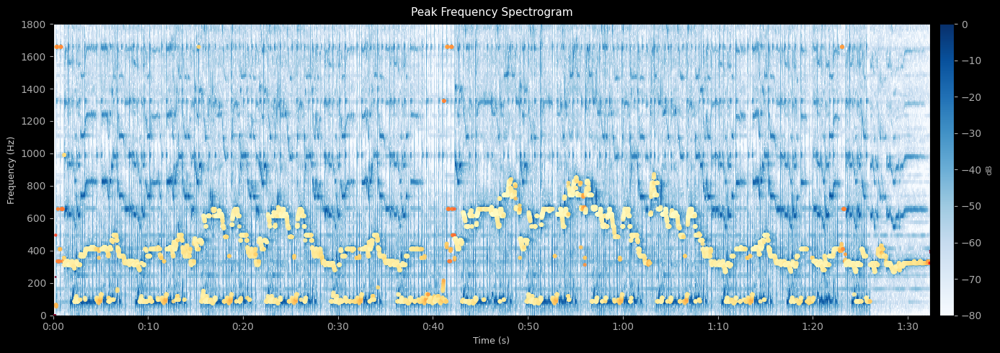

In [12]:
def plot_peak_spectrogram(y, sr, n_fft=4096, hop_length=512, figsize=(14, 5), max_freq=1800):
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    mag = np.abs(D)
    S_db = librosa.amplitude_to_db(mag, ref=np.max)

    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    times = librosa.frames_to_time(np.arange(D.shape[1]), sr=sr, hop_length=hop_length)

    peak_bins   = np.argmax(mag, axis=0)
    peak_freqs  = freqs[peak_bins]
    peak_mag_db = S_db[peak_bins, np.arange(D.shape[1])]

    norm_mag = (peak_mag_db - peak_mag_db.min()) / (np.ptp(peak_mag_db) + 1e-8)

    fig, ax = plt.subplots(figsize=figsize, facecolor="black")
    ax.set_facecolor("black")

    img = librosa.display.specshow(S_db, sr=sr, hop_length=hop_length,
                                   x_axis="time", y_axis="hz",
                                   cmap="Blues", ax=ax, vmin=-80, vmax=0)

    sizes = 4 + norm_mag * 18
    ax.scatter(times, peak_freqs, c=norm_mag, cmap="YlOrRd_r",
               s=sizes, zorder=5, linewidths=0, alpha=0.92)

    cbar = fig.colorbar(img, ax=ax, pad=0.01, fraction=0.02)
    cbar.set_label("dB", color="#aaaaaa", fontsize=8)
    cbar.ax.yaxis.set_tick_params(color="#aaaaaa")
    plt.setp(cbar.ax.yaxis.get_ticklabels(), color="#aaaaaa")
    ax.set_ylim(0, max_freq)
    ax.set_xlabel("Time (s)", color="#cccccc", fontsize=9)
    ax.set_ylabel("Frequency (Hz)", color="#cccccc", fontsize=9)
    ax.set_title("Peak Frequency Spectrogram", color="white", fontsize=11, pad=8)
    ax.tick_params(colors="#aaaaaa")

    plt.tight_layout()
    plt.show()

plot_peak_spectrogram(y, sr)
Audio(audio_path)

### Effect of ornamentations
We can already see from 7-8sec how ornamentations smoothes out the frequency curves making it a bit hard to clearly differentiate the start and end of svars

### Pitch Curves

Now I will extract the pitch curves and split into notes

In [13]:
import crepe
time, frequency, confidence, activation = crepe.predict(y, sr, viterbi=True)
smoothed_freq = smooth_pitch_curve(time, frequency)

289/289 ━━━━━━━━━━━━━━━━━━━━ 55s 189ms/step


In [14]:
import pandas as pd
import soundfile as sf
from scipy.ndimage import binary_erosion

def split_notes(
    y, sr,
    crepe_time, crepe_freq, crepe_conf,

    # Silence detection
    rms_threshold_db=-50,
    min_silence_dur=0.05,

    # Pitch jump detection
    conf_threshold=0.7,
    pitch_jump_semitones=1,

    # Segment filter
    min_seg_dur=0.1,

    # Output
    output_dir="notes",
    n_fft=4096,
    hop_length=512,
    max_freq=1800,
    figsize=(14, 5),

    # Smoothing
    smoothing_factor=0.5,
    min_points=4,
):
    os.makedirs(output_dir, exist_ok=True)
    total_frames = len(y) // hop_length + 1

    # ── 1. RMS silence mask ───────────────────────────────────────────────────
    rms    = librosa.feature.rms(y=y, frame_length=n_fft, hop_length=hop_length)[0]
    rms_db = librosa.amplitude_to_db(rms, ref=np.max)
    silent = rms_db < rms_threshold_db

    min_silence_frames = max(1, int(min_silence_dur * sr / hop_length))
    silence_mask = binary_erosion(silent, structure=np.ones(min_silence_frames))

    # ── 2. Interpolate CREPE onto STFT time grid ──────────────────────────────
    stft_times  = librosa.frames_to_time(np.arange(total_frames), sr=sr, hop_length=hop_length)
    freq_interp = np.interp(stft_times, crepe_time, crepe_freq)
    conf_interp = np.interp(stft_times, crepe_time, crepe_conf)

    voiced = conf_interp >= conf_threshold
    midi   = np.where(voiced & (freq_interp > 0),
                      librosa.hz_to_midi(np.clip(freq_interp, 1, None)),
                      np.nan)

    # ── 3. Pitch jump mask ────────────────────────────────────────────────────
    pitch_jump = np.zeros(total_frames, dtype=bool)
    for i in range(1, total_frames):
        if np.isfinite(midi[i]) and np.isfinite(midi[i - 1]):
            if abs(midi[i] - midi[i - 1]) >= pitch_jump_semitones:
                pitch_jump[i] = True
        elif voiced[i] and not voiced[i - 1]:
            pitch_jump[i] = True

    # ── 4. Combine cut points ─────────────────────────────────────────────────
    n   = min(len(silence_mask), len(pitch_jump))
    cut = np.zeros(n, dtype=bool)
    for i in range(1, n):
        if silence_mask[i - 1] and not silence_mask[i]:
            cut[i] = True
        if pitch_jump[i] and not silence_mask[i]:
            cut[i] = True
    cut[0] = True

    boundary_frames = np.where(cut)[0]
    boundary_frames = np.append(boundary_frames, n)

    # ── 5. Save segments + build dataframe rows ───────────────────────────────
    saved, skipped = 0, 0
    seg_info = []
    records  = []

    for i in range(len(boundary_frames) - 1):
        f_start = boundary_frames[i]
        f_end   = boundary_frames[i + 1]

        s_start = librosa.frames_to_samples(f_start, hop_length=hop_length)
        s_end   = min(librosa.frames_to_samples(f_end, hop_length=hop_length), len(y))
        dur     = (s_end - s_start) / sr

        t_start = stft_times[f_start]
        t_end   = stft_times[min(f_end, len(stft_times) - 1)]

        seg_voiced = voiced[f_start:f_end]
        if dur < min_seg_dur or seg_voiced.sum() < 2:
            skipped += 1
            continue

        mean_hz  = float(np.nanmean(freq_interp[f_start:f_end]))
        filename = f"note_{saved:03d}_{t_start:.3f}s.wav"
        filepath = os.path.join(output_dir, filename)
        sf.write(filepath, y[s_start:s_end], sr)
        saved += 1
        seg_info.append((t_start, t_end, mean_hz))
        print(f"  [{saved:03d}]  {t_start:.3f}s → {t_end:.3f}s  ({dur:.3f}s)")

        # ── Smooth pitch curve for this segment ───────────────────────────────
        mask = (
            (crepe_time >= t_start) &
            (crepe_time <= t_end) &
            (crepe_conf >= conf_threshold) &
            (crepe_freq > 0)
        )
        seg_t = crepe_time[mask]
        seg_f = crepe_freq[mask]

        if len(seg_t) < min_points:
            continue

        smoothed_freq = smooth_pitch_curve(
            seg_t, seg_f,
            smoothing_factor=smoothing_factor,
            min_points=min_points,
        )

        if smoothed_freq is None or len(smoothed_freq) < min_points:
            continue

        min_embed_len = 32
        if len(smoothed_freq) < min_embed_len:
            pad = min_embed_len - len(smoothed_freq)
            smoothed_freq = np.pad(smoothed_freq, (0, pad), mode='edge')

        # ── Embedding ─────────────────────────────────────────────────────────
        embedding = np.array(extract_embedding(smoothed_freq)).flatten()  # (48,)

        records.append({
            "filename":       filename,
            "filepath":       filepath,
            "t_start":        t_start,
            "t_end":          t_end,
            "duration":       dur,
            "mean_hz":        mean_hz,
            "smoothed_pitch": smoothed_freq,
            "embedding":      embedding,
        })

    print(f"\n✓ {saved} segments saved  ({skipped} skipped)  → '{output_dir}/'")

    df = pd.DataFrame(records)
    print(f"✓ DataFrame: {len(df)} rows with smoothed pitch + embeddings")

    # ── 6. Plot spectrogram + segments ────────────────────────────────────────
    D    = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    mag  = np.abs(D)
    S_db = librosa.amplitude_to_db(mag, ref=np.max)
    peak_bins   = np.argmax(mag, axis=0)
    freqs_all   = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    peak_freqs  = freqs_all[peak_bins]
    peak_mag_db = S_db[peak_bins, np.arange(D.shape[1])]
    norm_mag    = (peak_mag_db - peak_mag_db.min()) / (np.ptp(peak_mag_db) + 1e-8)
    plot_times  = librosa.frames_to_time(np.arange(D.shape[1]), sr=sr, hop_length=hop_length)

    fig, ax = plt.subplots(figsize=figsize, facecolor="black")
    ax.set_facecolor("black")

    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length,
                             x_axis="time", y_axis="hz",
                             cmap="Blues", ax=ax, vmin=-80, vmax=0)

    band_colors = ["#f5a623", "#b040fb"]
    for j, (ts, te, mhz) in enumerate(seg_info):
        ax.axvspan(ts, te, color=band_colors[j % 2], alpha=0.28, zorder=2)

    for ts, te, mhz in seg_info:
        ax.axvline(ts, color="white", linewidth=0.9, alpha=0.7, zorder=4)

    sizes = 4 + norm_mag * 18
    ax.scatter(plot_times, peak_freqs, c=norm_mag, cmap="YlOrRd_r",
               s=sizes, zorder=5, linewidths=0, alpha=0.92)

    v_mask = conf_interp >= conf_threshold
    ax.scatter(stft_times[v_mask], freq_interp[v_mask],
               color="#00f5d4", s=3, alpha=0.7, zorder=6, label="CREPE pitch")

    cbar = fig.colorbar(
        plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=-80, vmax=0)),
        ax=ax, pad=0.01, fraction=0.02
    )
    cbar.set_label("dB", color="#aaaaaa", fontsize=8)
    cbar.ax.yaxis.set_tick_params(color="#aaaaaa")
    plt.setp(cbar.ax.yaxis.get_ticklabels(), color="#aaaaaa")

    ax.set_ylim(0, max_freq)
    ax.set_xlabel("Time (s)", color="#cccccc", fontsize=9)
    ax.set_ylabel("Frequency (Hz)", color="#cccccc", fontsize=9)
    ax.set_title("Segment Detection — silence gaps + pitch jumps",
                 color="white", fontsize=11, pad=8)
    ax.tick_params(colors="#aaaaaa")
    ax.legend(fontsize=8, facecolor="#1a1a1a", labelcolor="white", framealpha=0.8)
    for sp in ax.spines.values():
        sp.set_edgecolor("#333333")

    plt.tight_layout()
    plt.show()

    return seg_info, df

  [001]  0.406s → 0.848s  (0.441s)
  [002]  0.848s → 1.207s  (0.360s)
  [003]  1.207s → 1.614s  (0.406s)
  [004]  1.614s → 2.171s  (0.557s)
  [005]  2.171s → 2.310s  (0.139s)
  [006]  2.461s → 2.891s  (0.430s)
  [007]  2.891s → 3.402s  (0.511s)
  [008]  3.402s → 3.634s  (0.232s)
  [009]  3.727s → 3.959s  (0.232s)
  [010]  4.017s → 4.238s  (0.221s)
  [011]  4.238s → 4.435s  (0.197s)
  [012]  4.493s → 4.772s  (0.279s)
  [013]  4.772s → 4.899s  (0.128s)
  [014]  4.899s → 5.132s  (0.232s)
  [015]  5.132s → 5.677s  (0.546s)
  [016]  5.677s → 5.782s  (0.104s)
  [017]  5.782s → 5.909s  (0.128s)
  [018]  5.956s → 6.165s  (0.209s)
  [019]  6.235s → 6.385s  (0.151s)
  [020]  6.687s → 6.838s  (0.151s)
  [021]  6.838s → 8.057s  (1.219s)
  [022]  8.057s → 8.475s  (0.418s)
  [023]  8.475s → 8.858s  (0.383s)
  [024]  8.858s → 9.044s  (0.186s)
  [025]  9.102s → 9.265s  (0.163s)
  [026]  9.334s → 9.752s  (0.418s)
  [027]  9.752s → 9.868s  (0.116s)
  [028]  9.868s → 10.275s  (0.406s)
  [029]  10.275s → 

/var/folders/py/_v9bd7p13qg3g1c_8mtg56pr0000gn/T/ipykernel_21994/3606271862.py:200: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



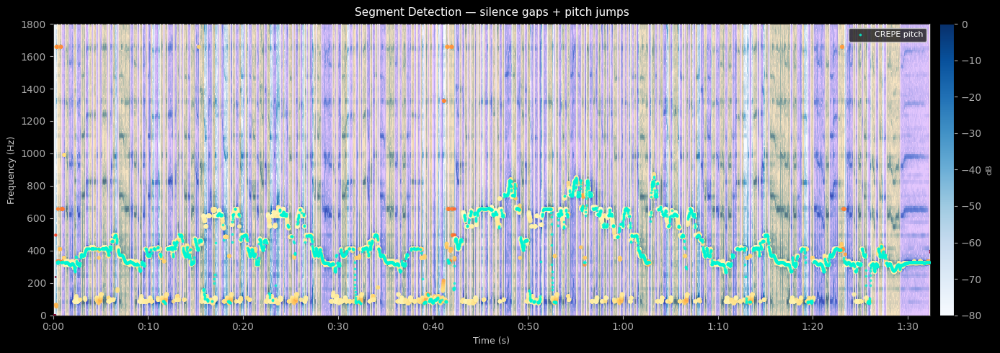

In [15]:
seg_info, df = split_notes(y, sr, crepe_time=time, crepe_freq=smoothed_freq, crepe_conf=confidence)

In [17]:
df.head()

,filename,filepath,t_start,t_end,duration,mean_hz,smoothed_pitch,embedding
0,note_000_0.406s.wav,notes/note_000_0.406s.wav,0.406349,0.847528,0.441179,328.754048,"[328.41409555272264, 327.21730209062207, 326.2...","[0.2338144, 0.03820563, 0.15246889, 0.13361424..."
1,note_001_0.848s.wav,notes/note_001_0.848s.wav,0.847528,1.207438,0.359909,329.508745,"[327.88771756107985, 327.9760236352598, 328.08...","[0.23385574, 0.038160175, 0.15266678, 0.133492..."
2,note_002_1.207s.wav,notes/note_002_1.207s.wav,1.207438,1.613787,0.406349,325.098919,"[327.15741816297196, 326.7240612642867, 326.35...","[0.25332218, 0.041611265, 0.1557299, 0.1024358..."
3,note_003_1.614s.wav,notes/note_003_1.614s.wav,1.613787,2.171066,0.557279,316.147013,"[320.8169812485561, 319.36559378986567, 318.05...","[0.22029108, 0.04480042, 0.14842854, 0.0660253..."
4,note_004_2.171s.wav,notes/note_004_2.171s.wav,2.171066,2.310385,0.139320,291.075044,"[307.3779145039389, 305.7680615008432, 303.522...","[0.23037884, 0.03803685, 0.15704875, 0.1383501..."


In [21]:
import umap
import base64, json
import ipywidgets as widgets
import plotly.graph_objects as go

def plot_umap_interactive(df, n_neighbors=15, min_dist=0.1, random_state=42):
    """
    Stacks embeddings → UMAP 2D → Plotly interactive scatter.
    Click any point to play its audio and see its smoothed pitch curve.
    Requires: pip install plotly
    """

    if len(df) < 4:
        print("Need at least 4 segments to run UMAP.")
        return df

    X = np.stack(df["embedding"].values)
    reducer = umap.UMAP(
        n_neighbors=min(n_neighbors, len(df) - 1),
        min_dist=min_dist,
        n_components=2,
        random_state=random_state,
    )
    coords   = reducer.fit_transform(X)
    df       = df.copy()
    df["umap_x"] = coords[:, 0]
    df["umap_y"] = coords[:, 1]

    # Encode each audio file as base64 so Plotly can play it in the browser
    def encode_audio(path):
        if not os.path.exists(path):
            return ""
        with open(path, "rb") as f:
            return base64.b64encode(f.read()).decode("utf-8")

    df["audio_b64"] = df["filepath"].apply(encode_audio)

    # Hover text
    hover = [
        f"<b>{row.filename}</b><br>"
        f"Duration: {row.duration:.2f}s<br>"
        f"Mean Hz: {row.mean_hz:.0f}"
        for _, row in df.iterrows()
    ]

    # Pitch curves as JSON strings for click callback
    pitch_json = [
        json.dumps({
            "t": list(range(len(row.smoothed_pitch))),
            "f": row.smoothed_pitch.tolist(),
            "title": f"{row.filename} | {row.duration:.2f}s | ~{row.mean_hz:.0f} Hz"
        })
        for _, row in df.iterrows()
    ]

    scatter = go.Scatter(
        x=df["umap_x"], y=df["umap_y"],
        mode="markers+text",
        text=[str(i) for i in range(len(df))],
        textposition="top right",
        textfont=dict(size=8, color="#888899"),
        marker=dict(
            size=12, color="#00d4ff",
            line=dict(width=0.5, color="white"),
            opacity=0.88,
        ),
        hovertext=hover,
        hoverinfo="text",
        customdata=list(zip(df["audio_b64"], pitch_json)),
    )

    layout = go.Layout(
        title=dict(text="Segment Embeddings — UMAP", font=dict(color="white", size=14)),
        paper_bgcolor="#0e0e14",
        plot_bgcolor="#0e0e14",
        xaxis=dict(title="UMAP 1", color="#aaaacc", gridcolor="#1e1e2e", zerolinecolor="#2a2a3a"),
        yaxis=dict(title="UMAP 2", color="#aaaacc", gridcolor="#1e1e2e", zerolinecolor="#2a2a3a"),
        font=dict(color="#aaaacc"),
        width=800, height=650,
        margin=dict(l=50, r=30, t=50, b=50),
    )

    fig = go.Figure(data=[scatter], layout=layout)

    # Output widgets for audio
    audio_out = widgets.Output()

    # Display Plotly figure
    from plotly.offline import iplot
    iplot(fig)

    # FigureWidget for click interactivity
    fw = go.FigureWidget(fig)

    def on_click(trace, points, state):
        if not points.point_inds:
            return
        idx = points.point_inds[0]
        row = df.iloc[idx]

        audio_out.clear_output(wait=True)

        with audio_out:
            if os.path.exists(row["filepath"]):
                display(Audio(filename=row["filepath"], autoplay=True))
            else:
                print(f"File not found: {row['filepath']}")

    fw.data[0].on_click(on_click)
    display(fw)
    display(audio_out)

/Users/sangarshananveera/dev/notebooks/.venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



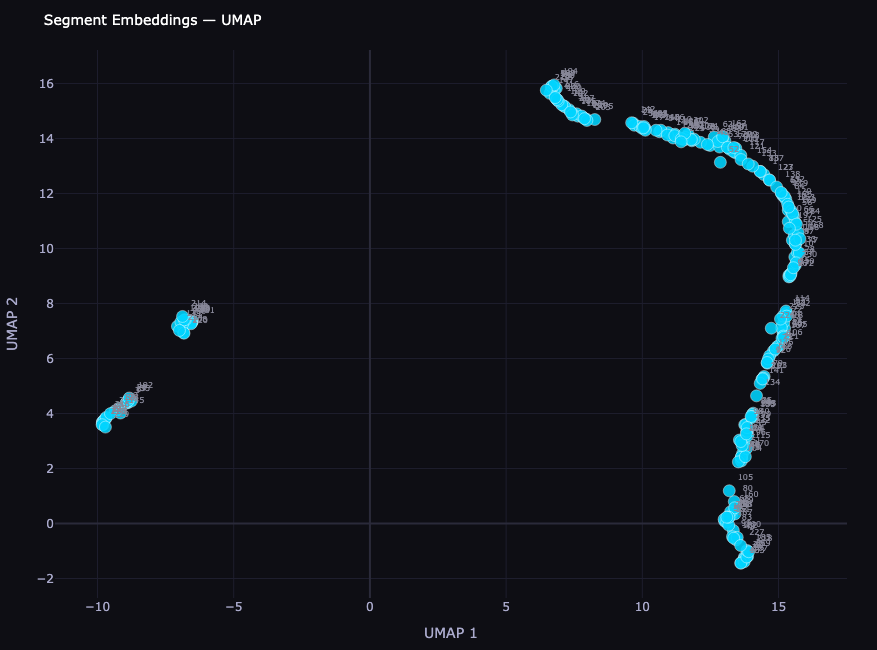

FigureWidget({
    'data': [{'customdata': [['UklGRiSYAABXQVZFZm10IBAAAAABAAEARKwAAIhYAQACABAAZGF
                             0YQCYAAC4AIoATwD3/5L/Sv8P/7v+Xv4W/t79x/3q/R7+L/43/mb+q
                             P7g/iL/cf+p/8X/6/8gAEMARgBCAEcAPgALAL7/cP8g/8f+f/5Y/jD
                             +7v25/bv91P3U/cv92P3s/QD+O/6g/vX+Lv9//+r/LQBBAFEAXQBOA
                             DYAKQARAOL/sf+F/1b/Jf/5/tr+3/4F/yr/RP9d/2X/ZP+O/+L/HgA
                             1AFAAWQA4ACIANQA9ADAANgA8ABAA1v/D/8D/tP+7/83/w/+k/5r/q
                             f/C/+T/CAAVAPz/yP+g/5//tP/A/8L/uP+O/1X/Pf9A/zz/Nv87/zb
                             /K/9C/4L/y/8UAGAAowDVAPoAEQEkAUQBYAFZATkBEAHUAI0AYgBNA
                             CIA3P+Z/1z/Jv8Z/0P/e/+d/7b/3v8MAC8AUACDAMMAAgE9AWcBZwF
                             EAS8BMwEoAf0AxAB8ACcA7//j/9P/nv9p/07/OP8q/0n/jP/G//v/T
                             gCjAMkA2gAXAW0BnQGkAaYBngGGAYEBmgGfAXMBOQEZAQwB9QDMAK4
                             AsgDEANAA8QAoAUcBTwF0Aa4BuAGWAX4B

Output()

In [22]:
plot_umap_interactive(df)